# Evaluate Benchbase Result

<img src="https://raw.githubusercontent.com/Beuth-Erdelt/Benchmark-Experiment-Host-Manager/master/docs/workflow-sketch-simple.png"/>

About the benchmark [1]:
> TPC-C involves a mix of five concurrent transactions of different types and complexity either executed on-line or queued for deferred execution. The database is comprised of nine types of tables with a wide range of record and population sizes. TPC-C is measured in transactions per minute (tpmC). While the benchmark portrays the activity of a wholesale supplier, TPC-C is not limited to the activity of any particular business segment, but, rather represents any industry that must manage, sell, or distribute a product or service.

<img src="https://raw.githubusercontent.com/wiki/cmu-db/benchbase/img/tpcc.png" alt="drawing" width="600"/>

References
1. https://github.com/cmu-db/benchbase/wiki/TPC-C


## Import Packages

In [1]:
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import pickle
# Some nice output
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
from IPython.display import display, Markdown
%matplotlib inline

import evaluator

## Prepare Result

### Pick Result

In [2]:
code = "1686844214"
path = "./"
marker = 192
styles=['s-', 'o-', '^-', 'x-']

### Start Evaluation

In [3]:
evaluation = evaluator.benchbase(code=code, path=path, include_loading=True, styles=styles)

### Transform all Benchmarking Log Files to DataFrames

We also pick the first log file to be an example for later

In [4]:
filename_example = ""

directory = os.fsencode(path+"/"+code)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.startswith("bexhoma-benchmarker") and filename.endswith(".log"):
        #print("filename:", filename)
        pod_name = filename[filename.rindex("-")+1:-len(".log")]
        #print("pod_name:", pod_name)
        jobname = filename[len("bexhoma-benchmarker-"):-len("-"+pod_name+".log")]
        print("jobname:", jobname)
        evaluation.end_benchmarking(jobname)
        filename_example = filename

jobname: postgresql-aws-1-1686844214-1-1
jobname: postgresql-aws-1-1686844214-1-2
jobname: postgresql-aws-1-1686844214-1-3
jobname: postgresql-aws-1-1686844214-1-4
jobname: postgresql-aws-1-1686844214-1-5
jobname: postgresql-aws-1-1686844214-1-6
jobname: postgresql-aws-1-1686844214-1-7
jobname: postgresql-aws-1-1686844214-1-8
jobname: postgresql-aws-2-1686844214-1-1
jobname: postgresql-aws-2-1686844214-1-1
jobname: postgresql-aws-2-1686844214-1-2
jobname: postgresql-aws-2-1686844214-1-2
jobname: postgresql-aws-2-1686844214-1-3
jobname: postgresql-aws-2-1686844214-1-3
jobname: postgresql-aws-2-1686844214-1-4
jobname: postgresql-aws-2-1686844214-1-4
jobname: postgresql-aws-2-1686844214-1-5
jobname: postgresql-aws-2-1686844214-1-5
jobname: postgresql-aws-2-1686844214-1-6
jobname: postgresql-aws-2-1686844214-1-6
jobname: postgresql-aws-2-1686844214-1-7
jobname: postgresql-aws-2-1686844214-1-7
jobname: postgresql-aws-2-1686844214-1-8
jobname: postgresql-aws-2-1686844214-1-8
jobname: postgre

### Show a DataFrame for single Pod as Example

In [5]:
filename = path+"/"+code+"/"+filename_example+".df.pickle"
print(filename)
df = pd.read_pickle(filename)
df

.//1686844214/bexhoma-benchmarker-postgresql-aws-8-1686844214-1-8-vlkxc.log.df.pickle


,connection,configuration,experiment_run,client,pod,pod_count,bench,profile,target,time,...,Throughput (requests/second),Latency Distribution.95th Percentile Latency (microseconds),Latency Distribution.Maximum Latency (microseconds),Latency Distribution.Median Latency (microseconds),Latency Distribution.Minimum Latency (microseconds),Latency Distribution.25th Percentile Latency (microseconds),Latency Distribution.90th Percentile Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),Latency Distribution.75th Percentile Latency (microseconds),Latency Distribution.Average Latency (microseconds)
PostgreSQL-AWS-8-8,,,,,,,,,,,,,,,,,,,,,
0,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8,1,8,vlkxc,8,tpcc,postgres,2048,900,...,294.183187,283598,1082800,80274,1809,48247,229312,473586,145178,108758


### Transform all DataFrames into single Result DataFrame

In [6]:
evaluation.evaluate_results()

## Get Benchmarking Result

In [7]:
df = evaluation.get_df_benchmarking()
df

,connection,configuration,experiment_run,client,pod,pod_count,bench,profile,target,time,...,Throughput (requests/second),Latency Distribution.95th Percentile Latency (microseconds),Latency Distribution.Maximum Latency (microseconds),Latency Distribution.Median Latency (microseconds),Latency Distribution.Minimum Latency (microseconds),Latency Distribution.25th Percentile Latency (microseconds),Latency Distribution.90th Percentile Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),Latency Distribution.75th Percentile Latency (microseconds),Latency Distribution.Average Latency (microseconds)
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-AWS-1-1-1,PostgreSQL-AWS-1-1,PostgreSQL-AWS-1,1,1,9z2wm,1,tpcc,postgres,16384,900,...,2479.399246,26880,230134,6426,2200,5212,24243,46234,19413,12904
PostgreSQL-AWS-1-2-1,PostgreSQL-AWS-1-2,PostgreSQL-AWS-1,1,2,rsvl8,1,tpcc,postgres,16384,900,...,4532.723267,27845,10470876,11445,1759,6176,25639,48438,20843,14117
PostgreSQL-AWS-1-3-1,PostgreSQL-AWS-1-3,PostgreSQL-AWS-1,1,3,gvccq,1,tpcc,postgres,16384,900,...,7228.820681,26883,4183501,9968,1770,5364,25165,48024,20457,13278
PostgreSQL-AWS-1-4-1,PostgreSQL-AWS-1-4,PostgreSQL-AWS-1,1,4,4gppm,1,tpcc,postgres,16384,900,...,9263.984478,27533,9474104,11447,1809,5516,25628,48389,20511,13815
PostgreSQL-AWS-1-5-1,PostgreSQL-AWS-1-5,PostgreSQL-AWS-1,1,5,6wk4d,1,tpcc,postgres,16384,900,...,11044.146088,28219,8607390,13135,1898,5732,26303,48171,21006,14485
PostgreSQL-AWS-1-6-1,PostgreSQL-AWS-1-6,PostgreSQL-AWS-1,1,6,jm7js,1,tpcc,postgres,16384,900,...,11672.778936,31225,8781777,14810,1953,6844,28896,44222,23253,16446
PostgreSQL-AWS-1-7-1,PostgreSQL-AWS-1-7,PostgreSQL-AWS-1,1,7,cmlhr,1,tpcc,postgres,16384,900,...,7758.778180,56053,10193900,27609,1907,17055,49308,71262,38329,28868
PostgreSQL-AWS-1-8-1,PostgreSQL-AWS-1-8,PostgreSQL-AWS-1,1,8,vlp2r,1,tpcc,postgres,16384,900,...,5877.802329,86672,2040931,41750,1994,27274,75167,111083,57960,43550
PostgreSQL-AWS-2-1-1,PostgreSQL-AWS-2-1,PostgreSQL-AWS-2,1,1,4f894,2,tpcc,postgres,8192,900,...,1161.849486,29820,1025368,11868,1707,5450,24942,46534,20136,13768


### Number of Warehouses

In [8]:
warehouses = int(df['sf'].max())
warehouses

48

### Reconstruct workflow out of result

In [9]:
evaluation.reconstruct_workflow(df)

{'PostgreSQL-AWS-1': [[1, 1, 1, 1, 1, 1, 1, 1]],
 'PostgreSQL-AWS-2': [[2, 2, 2, 2, 2, 2, 2, 2]],
 'PostgreSQL-AWS-4': [[4, 4, 4, 4, 4, 4, 4, 4]],
 'PostgreSQL-AWS-8': [[8, 8, 8, 8, 8, 8, 8, 8]]}

### Plot Results

#### Set data types for plotting

In [10]:
df_plot = evaluation.benchmarking_set_datatypes(df)

df_plot.T

connection_pod,PostgreSQL-AWS-1-1-1,PostgreSQL-AWS-1-2-1,PostgreSQL-AWS-1-3-1,PostgreSQL-AWS-1-4-1,PostgreSQL-AWS-1-5-1,PostgreSQL-AWS-1-6-1,PostgreSQL-AWS-1-7-1,PostgreSQL-AWS-1-8-1,PostgreSQL-AWS-2-1-1,PostgreSQL-AWS-2-1-2,...,PostgreSQL-AWS-8-7-7,PostgreSQL-AWS-8-7-8,PostgreSQL-AWS-8-8-1,PostgreSQL-AWS-8-8-2,PostgreSQL-AWS-8-8-3,PostgreSQL-AWS-8-8-4,PostgreSQL-AWS-8-8-5,PostgreSQL-AWS-8-8-6,PostgreSQL-AWS-8-8-7,PostgreSQL-AWS-8-8-8
connection,PostgreSQL-AWS-1-1,PostgreSQL-AWS-1-2,PostgreSQL-AWS-1-3,PostgreSQL-AWS-1-4,PostgreSQL-AWS-1-5,PostgreSQL-AWS-1-6,PostgreSQL-AWS-1-7,PostgreSQL-AWS-1-8,PostgreSQL-AWS-2-1,PostgreSQL-AWS-2-1,...,PostgreSQL-AWS-8-7,PostgreSQL-AWS-8-7,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8,PostgreSQL-AWS-8-8
configuration,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-2,PostgreSQL-AWS-2,...,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,1,2,3,4,5,6,7,8,1,1,...,7,7,8,8,8,8,8,8,8,8
pod,9z2wm,rsvl8,gvccq,4gppm,6wk4d,jm7js,cmlhr,vlp2r,4f894,4sfvt,...,tvjm9,wr77b,9j5zd,gwj6l,khx7p,q8tlg,qrfkv,rpjcd,sldmn,vlkxc
pod_count,1,1,1,1,1,1,1,1,2,2,...,8,8,8,8,8,8,8,8,8,8
bench,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,...,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc
profile,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,...,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres
target,16384,16384,16384,16384,16384,16384,16384,16384,8192,8192,...,2048,2048,2048,2048,2048,2048,2048,2048,2048,2048
time,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,...,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0


#### Sort / Restrict Results

In [11]:
df_plot['Throughput (requests/second)'].sort_values()

connection_pod
PostgreSQL-AWS-8-1-8      143.126552
PostgreSQL-AWS-8-1-7      144.363212
PostgreSQL-AWS-8-1-4      145.666507
PostgreSQL-AWS-8-1-1      145.729826
PostgreSQL-AWS-8-1-6      146.072090
PostgreSQL-AWS-8-1-2      146.662145
PostgreSQL-AWS-8-1-5      148.787656
PostgreSQL-AWS-8-1-3      151.618860
PostgreSQL-AWS-8-8-5      293.043098
PostgreSQL-AWS-8-8-4      293.248722
PostgreSQL-AWS-8-8-3      293.452094
PostgreSQL-AWS-8-8-6      293.496484
PostgreSQL-AWS-8-8-2      293.503282
PostgreSQL-AWS-8-8-7      293.841019
PostgreSQL-AWS-8-8-8      294.183187
PostgreSQL-AWS-8-8-1      294.419681
PostgreSQL-AWS-8-2-5      303.779771
PostgreSQL-AWS-8-2-3      304.394195
PostgreSQL-AWS-8-2-4      304.531921
PostgreSQL-AWS-8-2-7      305.620853
PostgreSQL-AWS-8-2-8      305.785480
PostgreSQL-AWS-8-2-2      306.056418
PostgreSQL-AWS-8-2-6      306.487727
PostgreSQL-AWS-8-2-1      307.456381
PostgreSQL-AWS-8-6-6      423.054369
PostgreSQL-AWS-8-6-1      424.012197
PostgreSQL-AWS-8-6-3   

In [12]:
#df_plot = df_plot[df_plot["experiment_run"]=="1"]
#df_plot = df_plot[df_plot["client"] == "1"]
df_plot.sort_values("target", inplace=True)

#### Plot metrics

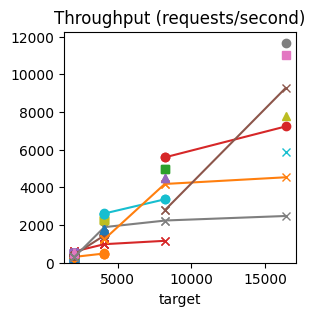

In [13]:
%matplotlib inline

x = "target"
y = "Throughput (requests/second)"
column = "terminals"
ax = evaluation.plot(df_plot, column=column, x=x, y=y, figsize=(3,3))#, plot_by="terminals")
ax.get_legend().remove()


<AxesSubplot: title={'center': 'Throughput (requests/second)'}, xlabel='terminals'>

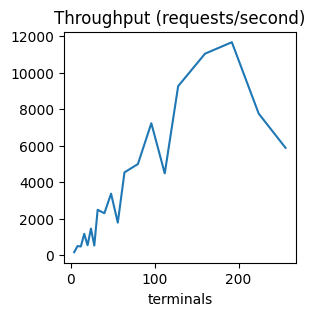

In [14]:
%matplotlib inline

x = "target"
y = "Throughput (requests/second)"
column = "terminals"
df_plot.groupby("terminals").max().plot(y="Throughput (requests/second)", figsize=(3,3), title="Throughput (requests/second)", legend=False)


<AxesSubplot: title={'center': 'Latency Distribution.Average Latency (microseconds)'}, xlabel='terminals'>

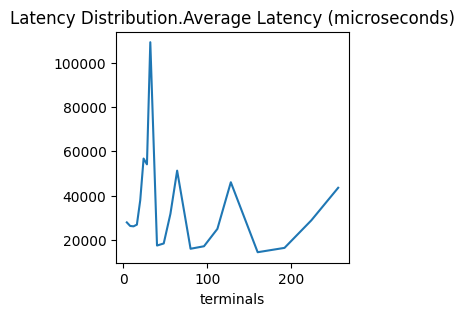

In [15]:
%matplotlib inline

x = "target"
y = "Latency Distribution.Average Latency (microseconds)"
column = "terminals"
df_plot.groupby("terminals").max().plot(y=y, figsize=(3,3), title=y, legend=False)


### Aggregate by parallel pods

In [16]:
df = evaluation.get_df_benchmarking()

df_plot = evaluation.benchmarking_set_datatypes(df)
df_aggregated = evaluation.benchmarking_aggregate_by_parallel_pods(df_plot)
df_aggregated.sort_values("target", inplace=True)
df_aggregated.T

,PostgreSQL-AWS-1-1,PostgreSQL-AWS-8-6,PostgreSQL-AWS-8-5,PostgreSQL-AWS-8-4,PostgreSQL-AWS-8-3,PostgreSQL-AWS-8-2,PostgreSQL-AWS-8-1,PostgreSQL-AWS-4-8,PostgreSQL-AWS-4-7,PostgreSQL-AWS-4-6,...,PostgreSQL-AWS-2-1,PostgreSQL-AWS-1-8,PostgreSQL-AWS-1-7,PostgreSQL-AWS-1-6,PostgreSQL-AWS-1-5,PostgreSQL-AWS-1-4,PostgreSQL-AWS-1-3,PostgreSQL-AWS-1-2,PostgreSQL-AWS-8-7,PostgreSQL-AWS-8-8
connection,PostgreSQL-AWS-1-1,PostgreSQL-AWS-8-6,PostgreSQL-AWS-8-5,PostgreSQL-AWS-8-4,PostgreSQL-AWS-8-3,PostgreSQL-AWS-8-2,PostgreSQL-AWS-8-1,PostgreSQL-AWS-4-8,PostgreSQL-AWS-4-7,PostgreSQL-AWS-4-6,...,PostgreSQL-AWS-2-1,PostgreSQL-AWS-1-8,PostgreSQL-AWS-1-7,PostgreSQL-AWS-1-6,PostgreSQL-AWS-1-5,PostgreSQL-AWS-1-4,PostgreSQL-AWS-1-3,PostgreSQL-AWS-1-2,PostgreSQL-AWS-8-7,PostgreSQL-AWS-8-8
configuration,PostgreSQL-AWS-1,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-8,PostgreSQL-AWS-4,PostgreSQL-AWS-4,PostgreSQL-AWS-4,...,PostgreSQL-AWS-2,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-1,PostgreSQL-AWS-8,PostgreSQL-AWS-8
experiment_run,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
client,1,6,5,4,3,2,1,8,7,6,...,1,8,7,6,5,4,3,2,7,8
pod,9z2wm,7wfn4hlqhhjfbcpmlmcrpcnx5rksfcvjtpvwdck9,5cvnl7tj6k8mp9z9c87wgqmqnmvw6rw6jl2xvlm7,bd9tlh72b6k6wbfkl456pd4czqqkx4tx8q5vfgsk,25t5d2xndb6j97z8pnvff2btqhzh8vwqq88z9znh,2nnc85xgsk76t697hlskn6mfbtmtsqvvg2czt26h,b9wlsbb9vjrpllssrp7pt5t4mvcrzxvwmm9xv4fn,22w7vknthslh9zqvt462,2bllpc5ghnl9whwxmhdb,4sxpmbmm7gdwpz4kqv9z,...,4f8944sfvt,vlp2r,cmlhr,jm7js,6wk4d,4gppm,gvccq,rsvl8,2vrbw892t8cm85mhhz4dqbskstfvn9tvjm9wr77b,9j5zdgwj6lkhx7pq8tlgqrfkvrpjcdsldmnvlkxc
pod_count,1,8,8,8,8,8,8,4,4,4,...,2,1,1,1,1,1,1,1,8,8
bench,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,...,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc,tpcc
profile,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,...,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres,postgres
target,16384,16384,16384,16384,16384,16384,16384,16384,16384,16384,...,16384,16384,16384,16384,16384,16384,16384,16384,16384,16384
time,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,...,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0,900.0


#### Plot

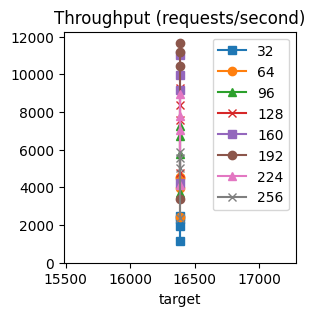

In [17]:
%matplotlib inline

x = "target"
y = "Throughput (requests/second)"
column = "terminals"
ax = evaluation.plot(df_aggregated, column=column, x=x, y=y, figsize=(3,3))#, plot_by="pod_count")
#ax.get_legend().remove()


<AxesSubplot: title={'center': 'Throughput (requests/second)'}, xlabel='terminals'>

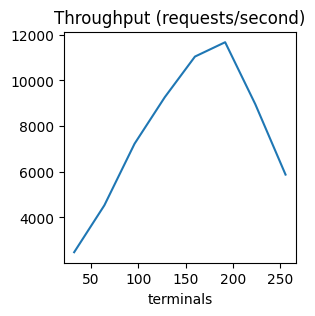

In [18]:
%matplotlib inline

x = "target"
y = "Throughput (requests/second)"
column = "terminals"
df_aggregated.groupby(["terminals"]).max().plot(y="Throughput (requests/second)", figsize=(3,3), title="Throughput (requests/second)", legend=False)


#### Plot Tpx per Number of Pods

0      2479.399246
1      4532.723267
2      7228.820681
3      9263.984478
4     11044.146088
5     11672.778936
6      7758.778180
7      5877.802329
8      2319.445435
9      4474.434345
10     6726.157572
11     8357.944351
12     9972.931024
13    11180.634220
14     8955.742506
15     5561.412188
16     1953.197995
17     3942.160519
18     5792.696494
19     7590.430046
20     9151.555099
21    10432.482517
22     7057.560719
23     5001.939577
24     1172.026848
25     2444.112745
26     3685.072416
27     4759.542905
28     4235.736590
29     3394.119257
30     4140.731989
31     2349.187567
Name: Throughput (requests/second), dtype: float64

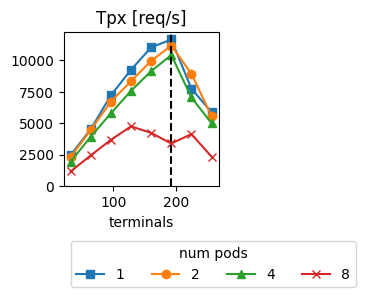

In [19]:
%matplotlib inline

x = "terminals"
y = "Throughput (requests/second)"
column = "pods"
df_plot.sort_values('target', inplace=True)
df_aggregated.groupby(["pod_count", "terminals"]).max().reset_index().rename(columns={'pod_count':'pods'})
df_plot_this = df_aggregated.groupby(["pod_count", "terminals"]).max().reset_index().rename(columns={'pod_count':'pods'})

ax = evaluation.plot(df_plot_this, column=column, x=x, y=y, figsize=(2,2))
ax.title.set_size(9)
plt.legend(loc='lower left', title='num pods', bbox_to_anchor=(0.0, -0.7), ncol=4)
ax.set_title("Tpx [req/s]")
ax.set_xlabel("terminals")
#ax.get_legend().remove()
ax.axvline(marker, color='k', linestyle='--')
df_plot_this[y]

#### Plot Tpx per Number of Pods without Legend

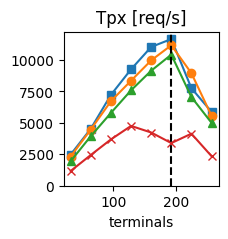

In [20]:
ax = evaluation.plot(df_plot_this, column=column, x=x, y=y, figsize=(2,2))#, plot_by="pod_count")
ax.title.set_size(9)
plt.legend(loc='lower left', title='num pods', bbox_to_anchor=(0.0, -0.7), ncol=4)
ax.set_title("Tpx [req/s]")
ax.set_xlabel("terminals")
#ax.get_legend().remove()
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()


#### Plot Latency per Number of Pods

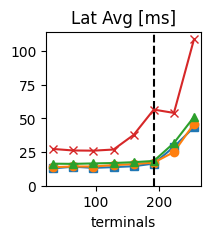

In [21]:
%matplotlib inline

y = "Latency Distribution.Average Latency (microseconds)"
x = "terminals"
column = "pods"
df_plot = df_aggregated.groupby(["pod_count", "terminals"]).max().reset_index().rename(columns={'pod_count':'pods'})
df_plot[y] = df_plot[y]/1000
ax = evaluation.plot(df_plot, column=column, x=x, y=y, figsize=(2,2))#, plot_by="pod_count")
df_aggregated.groupby(["pod_count", "terminals"]).max().reset_index()
ax.title.set_size(9)
ax.set_title("Lat Avg [ms]")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(loc='upper left', title='num pods')
plt.gca().get_legend().remove()


#### Plot Deadlocks per Number of Pods

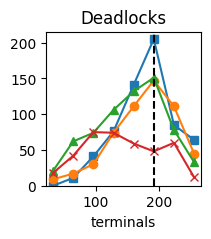

In [22]:
%matplotlib inline

y = "num_deadlocks"
x = "terminals"
column = "pods"
df_plot.sort_values('target', inplace=True)
ax = evaluation.plot(df_aggregated.groupby(["pod_count", "terminals"]).max().reset_index().rename(columns={'pod_count':'pods'}), column=column, x=x, y=y, figsize=(2,2))#, plot_by="pod_count")
df_aggregated.groupby(["pod_count", "terminals"]).max().reset_index()
ax.title.set_size(9)
ax.set_title("Deadlocks")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(loc='upper left', title='num pods')
plt.gca().get_legend().remove()


<AxesSubplot: xlabel='terminals'>

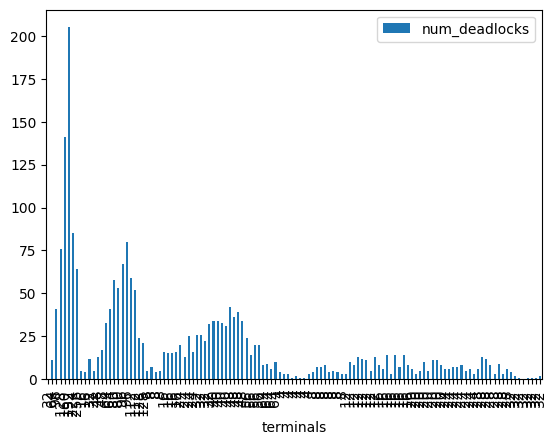

In [23]:
df_plot_this = pd.DataFrame(df_aggregated.sort_values("target").max())
df.plot.bar(column=column, x=x, y=y)#, plot_by="pod_count")

## Show Infos about Connections

In [24]:
import ast

with open(path+code+"/connections.config",'r') as inf:
    connections = ast.literal_eval(inf.read())

print("found", len(connections), "connections")

found 32 connections


In [25]:
import json
#pretty_connections = json.dumps(connections, indent=2)

#print(pretty_connections)

### Loading time per number of loading threads

In [26]:
connections_sorted = sorted(connections, key=lambda c: c['name']) 

result = dict()

for c in connections_sorted:
    print(c['name'], 
          c['timeLoad'], 
          '[s] for', 
          c['parameter']['connection_parameter']['loading_parameters']['BENCHBASE_TERMINALS'], 
          'threads on',
          c['hostsystem']['node'])
    result[c['name']] = {
        'time_load': c['timeIngesting'],
        'terminals': c['parameter']['connection_parameter']['loading_parameters']['BENCHBASE_TERMINALS'],
        #'target': c['parameter']['connection_parameter']['loading_parameters']['BENCHBASE_TARGET'],
        'pods': c['parameter']['parallelism'],
    }
    #result[c['parameter']['connection_parameter']['loading_parameters']['BENCHBASE_TERMINALS']] = c['timeIngesting']


df = pd.DataFrame(result)#, index=['time_load'])#, index=result.keys())

#print(df)
#df = df.T.pivot(columns='terminals', index='target', values='time_load')
df_connections = df.copy()
df

PostgreSQL-AWS-1-1 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-2 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-3 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-4 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-5 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-6 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-7 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-1-8 222.14329200494103 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-2-1 222.07604064804036 [s] for 36 threads on ip-192-168-31-143.eu-central-1.compute.internal
PostgreSQL-AWS-2-2 222.07604

,PostgreSQL-AWS-1-1,PostgreSQL-AWS-1-2,PostgreSQL-AWS-1-3,PostgreSQL-AWS-1-4,PostgreSQL-AWS-1-5,PostgreSQL-AWS-1-6,PostgreSQL-AWS-1-7,PostgreSQL-AWS-1-8,PostgreSQL-AWS-2-1,PostgreSQL-AWS-2-2,...,PostgreSQL-AWS-4-7,PostgreSQL-AWS-4-8,PostgreSQL-AWS-8-1,PostgreSQL-AWS-8-2,PostgreSQL-AWS-8-3,PostgreSQL-AWS-8-4,PostgreSQL-AWS-8-5,PostgreSQL-AWS-8-6,PostgreSQL-AWS-8-7,PostgreSQL-AWS-8-8
time_load,220,220,220,220,220,220,220,220,220,220,...,216,216,216,216,216,216,216,216,216,216
terminals,36,36,36,36,36,36,36,36,36,36,...,36,36,36,36,36,36,36,36,36,36
pods,1,1,1,1,1,1,1,1,2,2,...,4,4,8,8,8,8,8,8,8,8


<AxesSubplot: title={'center': 'Loading time [s]'}>

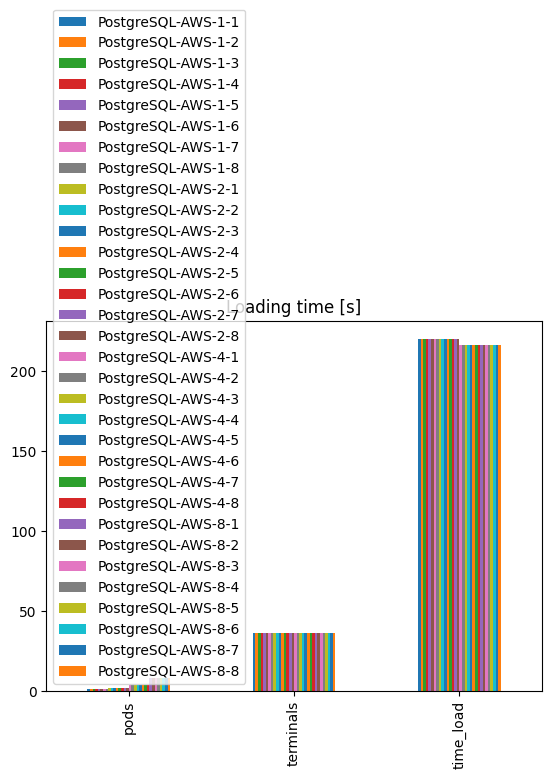

In [27]:
df.sort_index().plot.bar(title="Loading time [s]")#, x="target")#, by="terminals")#, columns="time_load")
#df[1]

<AxesSubplot: title={'center': 'Imported warehouses [1/h]'}>

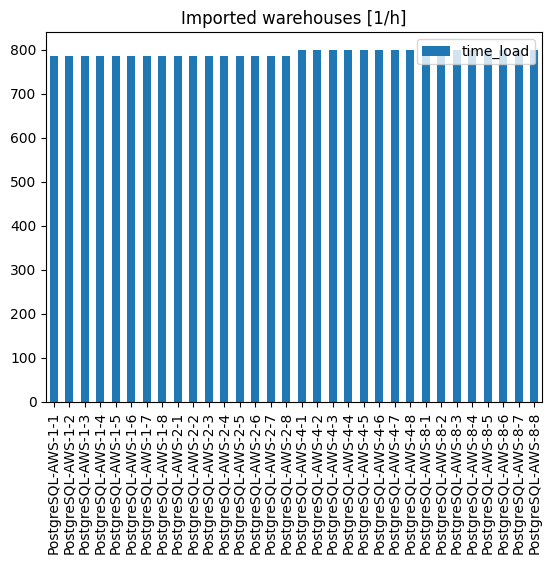

In [28]:
df_tpx = (warehouses*3600.0)/df.T.sort_index()
df_tpx
pd.DataFrame(df_tpx['time_load']).plot.bar(title="Imported warehouses [1/h]")

## Get Loading Results

In [29]:
filename_example = ""

directory = os.fsencode(path+"/"+code)
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.startswith("bexhoma-loading") and filename.endswith(".sensor.log"):
        #print("filename:", filename)
        pod_name = filename[filename.rindex("-")+1:-len(".log")]
        #print("pod_name:", pod_name)
        jobname = filename[len("bexhoma-loading-"):-len("-"+pod_name+".sensor.log")]
        print("jobname:", jobname)
        evaluation.end_loading(jobname)
        filename_example = filename

jobname: postgresql-aws-1-1686844
jobname: postgresql-aws-2-1686844
jobname: postgresql-aws-4-1686844
jobname: postgresql-aws-8-1686844


## Get monitoring metrics

### Loading

In [30]:
evaluation.transform_monitoring_results()

#### Example metric

In [31]:
evaluation.get_monitoring_metrics()

df = evaluation.get_monitoring_metric('total_cpu_memory')

df.T

,0,1,2,3,4,5,6,7,8,9,...,264,265,266,267,268,269,270,271,272,273
PostgreSQL-AWS-1-1,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-2,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-3,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-4,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-5,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-6,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-7,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-1-8,2376.554688,2376.554688,2376.554688,2376.554688,2376.554688,2376.945312,2376.945312,2376.945312,2376.945312,2376.945312,...,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062,7377.414062
PostgreSQL-AWS-2-1,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,...,7385.093750,7385.093750,7385.093750,7385.093750,7385.093750,7385.093750,7385.093750,NaN,NaN,NaN
PostgreSQL-AWS-2-2,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,2384.417969,...,7385.093750,7385.093750,7385.093750,7385.093750,7385.093750,7385.093750,7385.093750,NaN,NaN,NaN


#### Plot all metrics

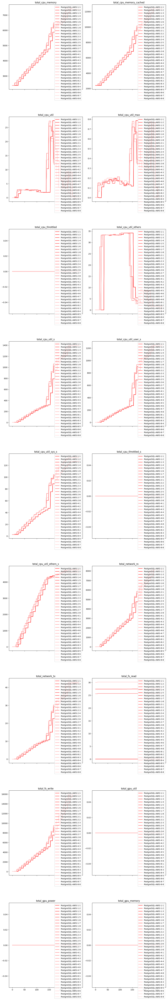

In [32]:
dict_colors = evaluation.get_dict_color_by_connection_property('docker')

evaluation.plot_all_metrics(component='loading', dict_colors=dict_colors)

### Benchmarking

In [33]:
evaluation.transform_monitoring_results(component='stream')

#### Plot all metrics

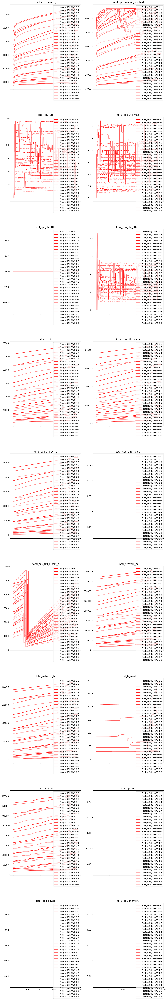

In [34]:
dict_colors = evaluation.get_dict_color_by_connection_property('docker')

evaluation.plot_all_metrics(component='stream', dict_colors=dict_colors)

## Loader Component

In [35]:
evaluation.transform_monitoring_results(component='loader')

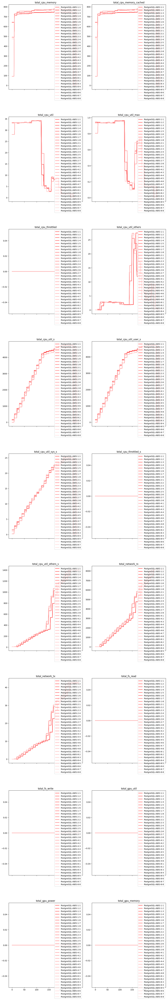

In [36]:
dict_colors = evaluation.get_dict_color_by_connection_property('docker')

evaluation.plot_all_metrics(component='loader', dict_colors=dict_colors)

## Benchmarker Component

In [37]:
evaluation.transform_monitoring_results(component='benchmarker')

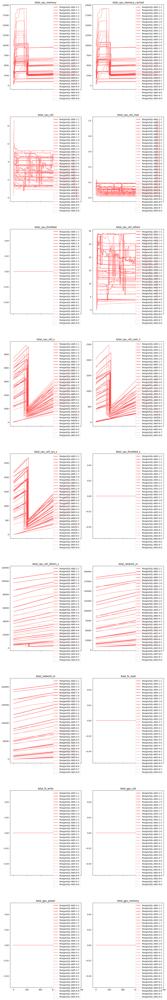

In [38]:
dict_colors = evaluation.get_dict_color_by_connection_property('docker')

evaluation.plot_all_metrics(component='benchmarker', dict_colors=dict_colors)

## Plot Maximums

### Benchmark SUT

pods,1,2,4,8
terminals,,,,
32,3622.372829,3525.453837,3196.489489,2348.928075
64,9520.680947,7491.400760,5418.579993,3573.712198
96,10924.232625,10441.461005,8711.188563,5540.513961
128,15162.853646,13883.868961,12486.312252,8394.895916
160,20155.276772,17860.639492,16631.648632,9788.825570
192,25384.156651,22472.111489,21726.545961,8479.528274
224,17492.701485,20283.164012,16645.035876,9746.210838
256,13117.000514,12661.649546,11786.885515,6381.055206


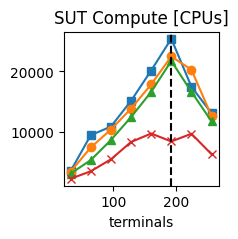

In [39]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='stream').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='stream').min()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot(figsize=(2,2),legend=True, style=styles)
#plt.legend(loc='best')
ax.title.set_size(9)
ax.set_title("SUT Compute [CPUs]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(title='num pods')
plt.gca().get_legend().remove()

df

pods,1,2,4,8
terminals,,,,
32,4.106182,4.296467,3.911790,3.076427
64,11.304911,9.852129,6.133667,4.240087
96,12.411791,11.950445,9.870825,7.616250
128,17.850517,16.039914,14.123921,10.385109
160,23.298461,20.764574,19.408201,14.223213
192,29.190791,27.177388,26.180349,17.428690
224,27.989472,28.927956,27.948500,17.285914
256,15.427646,16.234925,14.181320,8.761927


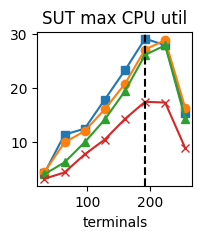

In [40]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='stream').max()
df.T
#df.plot.bar()
#df = evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').min()
#df = df.filter(regex='12288', axis=0)
#df['connection'] = df.index
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("SUT max CPU util")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()
df

pod_count,1,2,4,8
terminals,,,,
32,9.775547,9.579819,9.241528,8.629726
64,14.159145,14.038979,13.119823,11.218761
96,21.101444,20.767921,18.889050,15.090263
128,29.961742,29.062984,26.516895,20.074509
160,41.028553,39.051872,35.777580,24.686684
192,52.471989,50.080517,46.575790,28.129208
224,58.402443,58.044868,53.112419,32.713551
256,62.872093,61.949570,57.569729,34.910561


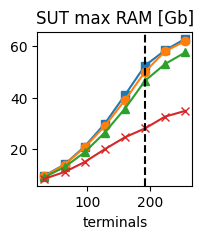

In [41]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='stream').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pod_count'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pod_count', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df/1024

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("SUT max RAM [Gb]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()
df

pod_count,1,2,4,8
terminals,,,,
32,16.662842,16.297798,15.643661,14.467266
64,24.464218,24.223202,22.500900,18.937023
96,37.132900,36.447277,32.856369,25.624195
128,52.975033,51.268093,46.748379,34.468452
160,65.087818,65.430641,62.541363,42.703976
192,65.502701,65.429146,65.428806,48.942280
224,65.487831,65.432339,65.381142,56.814487
256,65.443459,65.439129,65.307281,60.777161


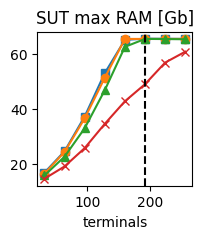

In [42]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='stream').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pod_count'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pod_count', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df/1024

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("SUT max RAM [Gb]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()

df

pod_count,1,2,4,8
terminals,,,,
32,15.692307,14.799406,15.681670,14.496708
64,47.885085,42.255321,26.019182,23.005600
96,49.413701,48.557508,42.083589,35.839992
128,64.061518,62.316671,57.677326,49.571923
160,81.924711,74.221438,71.172100,60.258576
192,127.658020,96.277936,93.795844,67.112415
224,130.061876,124.828881,107.419848,63.782122
256,57.216558,59.635917,54.743277,36.158645


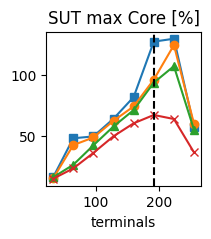

In [43]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='stream').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pod_count'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pod_count', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df*100

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("SUT max Core [%]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()
df

pod_count,1,2,4,8
terminals,,,,
32,16.195634,15.575702,14.279210,11.724566
64,31.073543,30.309996,27.089673,19.617340
96,54.431119,52.449269,45.899572,31.503864
128,84.030283,79.592167,70.548609,46.854002
160,119.124193,111.715542,100.273117,60.585370
192,156.086895,147.492255,134.139700,71.669691
224,180.745718,176.088914,157.106123,85.161873
256,199.444101,193.910408,173.404870,92.896453


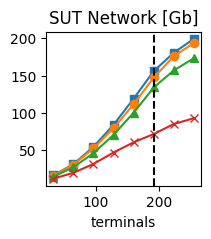

In [44]:
df = evaluation.get_monitoring_metric('total_network_rx', component='stream').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pod_count'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pod_count', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df=df/1024

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("SUT Network [Gb]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()
df

### Benchmark Driver

pods,1,2,4,8
terminals,,,,
32,1206.961994,1182.882887,1097.239022,862.459318
64,1308.721141,1440.063652,1349.061125,1005.135636
96,1956.491392,2084.616299,2031.367571,1332.324602
128,2533.581583,2677.695273,2623.014478,1770.666317
160,3183.714550,3236.338320,3335.727448,2219.387035
192,3638.859031,3925.245182,4100.841660,2104.837493
224,3993.565770,4468.107394,4638.641762,1764.940315
256,2651.218058,3487.342199,3133.574056,2064.913284


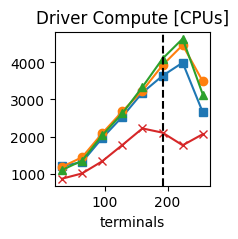

In [45]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='benchmarker').min()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("Driver Compute [CPUs]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(loc='upper left', title='num pods')
plt.gca().get_legend().remove()
df

pods,1,2,4,8
terminals,,,,
32,1.520779,1.699108,1.589577,1.528946
64,2.126298,2.217464,2.542658,2.141262
96,3.094140,3.756200,3.740237,3.001068
128,3.908888,3.831518,4.375166,3.928106
160,4.204553,5.071745,5.754469,4.610158
192,4.653855,5.566561,8.568668,7.414376
224,3.987300,5.113835,7.091514,3.905708
256,2.613224,2.977539,3.139727,2.312178


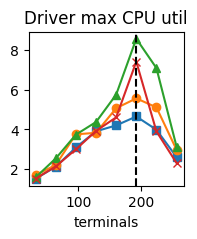

In [46]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='benchmarker').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("Driver max CPU util")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(loc='upper left', title='num pods')
plt.gca().get_legend().remove()
df

pods,1,2,4,8
terminals,,,,
32,22.714505,11.749619,8.676391,6.712417
64,35.697040,6.931268,10.605642,7.956484
96,99.646719,16.889759,10.775088,10.961674
128,99.951091,83.322145,9.289639,7.662255
160,99.954444,99.948591,13.157640,11.510696
192,99.877256,98.927331,15.274439,11.479517
224,99.548608,92.402409,15.536494,10.823228
256,93.148979,11.737358,13.730905,8.931492


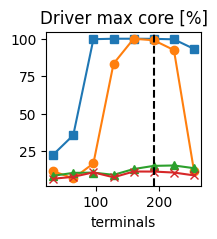

In [47]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='benchmarker').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df=df*100

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("Driver max core [%]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(loc='right', title='num pods')
plt.gca().get_legend().remove()
df

pods,1,2,4,8
terminals,,,,
32,1.055317,1.699894,3.106438,5.777565
64,3.369503,3.436996,6.311550,11.722023
96,4.983337,6.523647,6.740746,12.170376
128,5.442272,9.570061,7.027466,12.542377
160,5.701420,9.819218,10.047184,12.999340
192,5.895226,10.134144,15.757324,13.211700
224,6.011826,7.301044,18.742390,13.338585
256,9.256256,10.316105,18.667294,13.357841


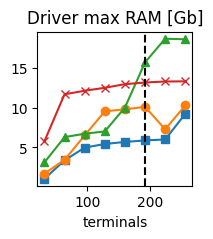

In [48]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='benchmarker').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df=df/1024

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("Driver max RAM [Gb]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.legend(title='num pods')
plt.gca().get_legend().remove()
df

pod_count,1,2,4,8
terminals,,,,
32,1.073444,1.699894,3.106438,5.777565
64,3.387630,3.436996,6.311550,11.722023
96,5.013424,6.523647,6.740746,12.170376
128,5.593712,9.573334,7.027466,12.542377
160,5.981640,10.004017,10.047184,12.999340
192,6.262180,10.457668,15.757324,13.211700
224,6.365940,7.670013,18.743271,13.338585
256,9.426830,10.538418,18.706192,13.357841


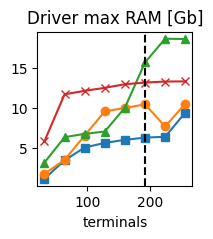

In [49]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='benchmarker').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pod_count'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pod_count', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df=df/1024

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("Driver max RAM [Gb]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()
df

pod_count,1,2,4,8
terminals,,,,
32,16.195634,15.575702,14.279210,11.724566
64,31.073543,30.309996,27.089673,19.617340
96,54.431119,52.449269,45.899572,31.503864
128,84.030283,79.592167,70.548609,46.854002
160,119.124193,111.715542,100.273118,60.585370
192,156.086895,147.492255,134.139700,71.669691
224,180.745718,176.088914,157.106123,85.161873
256,199.444101,193.910408,173.404870,92.896453


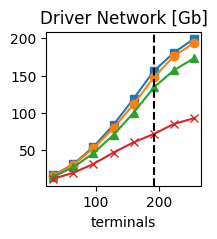

In [50]:
df = evaluation.get_monitoring_metric('total_network_rx', component='benchmarker').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pod_count'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pod_count', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df=df/1024

ax = df.plot(figsize=(2,2),legend=True, style=styles)
ax.title.set_size(9)
ax.set_title("Driver Network [Gb]")
ax.set_xlabel("terminals")
ax.axvline(marker, color='k', linestyle='--')
plt.gca().get_legend().remove()

df

### Loading SUT

pods,1,2,4,8
terminals,,,,
32,1392.761854,1388.340371,1386.559972,1395.98527
64,1392.761854,1388.340371,1386.559972,1395.98527
96,1392.761854,1388.340371,1386.559972,1395.98527
128,1392.761854,1388.340371,1386.559972,1395.98527
160,1392.761854,1388.340371,1386.559972,1395.98527
192,1392.761854,1388.340371,1386.559972,1395.98527
224,1392.761854,1388.340371,1386.559972,1395.98527
256,1392.761854,1388.340371,1386.559972,1395.98527


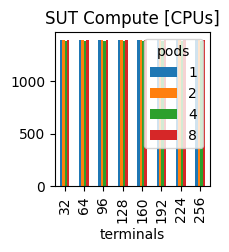

In [51]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='loading').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='loading').min()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("SUT Compute [CPUs]")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,27.423269,25.498805,27.296351,26.648441
64,27.423269,25.498805,27.296351,26.648441
96,27.423269,25.498805,27.296351,26.648441
128,27.423269,25.498805,27.296351,26.648441
160,27.423269,25.498805,27.296351,26.648441
192,27.423269,25.498805,27.296351,26.648441
224,27.423269,25.498805,27.296351,26.648441
256,27.423269,25.498805,27.296351,26.648441


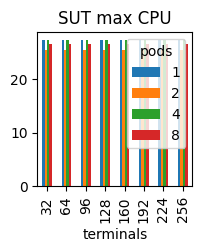

In [52]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='loading').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("SUT max CPU")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,78.552709,77.189326,77.922988,77.863649
64,78.552709,77.189326,77.922988,77.863649
96,78.552709,77.189326,77.922988,77.863649
128,78.552709,77.189326,77.922988,77.863649
160,78.552709,77.189326,77.922988,77.863649
192,78.552709,77.189326,77.922988,77.863649
224,78.552709,77.189326,77.922988,77.863649
256,78.552709,77.189326,77.922988,77.863649


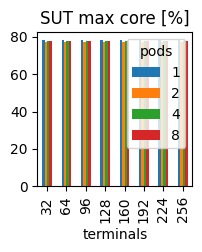

In [53]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='loading').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df*100

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("SUT max core [%]")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,7.263847,7.212494,7.263565,7.23584
64,7.263847,7.212494,7.263565,7.23584
96,7.263847,7.212494,7.263565,7.23584
128,7.263847,7.212494,7.263565,7.23584
160,7.263847,7.212494,7.263565,7.23584
192,7.263847,7.212494,7.263565,7.23584
224,7.263847,7.212494,7.263565,7.23584
256,7.263847,7.212494,7.263565,7.23584


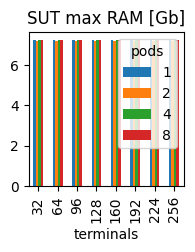

In [54]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='loading').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df/1024

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("SUT max RAM [Gb]")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,12.125401,12.10577,12.108376,12.109001
64,12.125401,12.10577,12.108376,12.109001
96,12.125401,12.10577,12.108376,12.109001
128,12.125401,12.10577,12.108376,12.109001
160,12.125401,12.10577,12.108376,12.109001
192,12.125401,12.10577,12.108376,12.109001
224,12.125401,12.10577,12.108376,12.109001
256,12.125401,12.10577,12.108376,12.109001


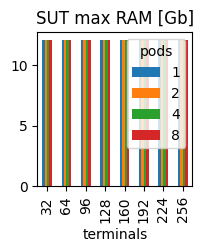

In [55]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='loading').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df/1024

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("SUT max RAM [Gb]")
ax.set_xlabel("terminals")
df

### Loading Driver

pods,1,2,4,8
terminals,,,,
32,4746.624101,4731.104756,4606.271836,4572.443858
64,4746.624101,4731.104756,4606.271836,4572.443858
96,4746.624101,4731.104756,4606.271836,4572.443858
128,4746.624101,4731.104756,4606.271836,4572.443858
160,4746.624101,4731.104756,4606.271836,4572.443858
192,4746.624101,4731.104756,4606.271836,4572.443858
224,4746.624101,4731.104756,4606.271836,4572.443858
256,4746.624101,4731.104756,4606.271836,4572.443858


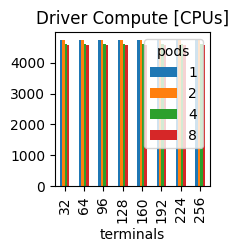

In [56]:
df = evaluation.get_monitoring_metric('total_cpu_util_s', component='loader').max() - evaluation.get_monitoring_metric('total_cpu_util_s', component='loader').min()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("Driver Compute [CPUs]")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,34.210772,34.161607,34.094782,34.073466
64,34.210772,34.161607,34.094782,34.073466
96,34.210772,34.161607,34.094782,34.073466
128,34.210772,34.161607,34.094782,34.073466
160,34.210772,34.161607,34.094782,34.073466
192,34.210772,34.161607,34.094782,34.073466
224,34.210772,34.161607,34.094782,34.073466
256,34.210772,34.161607,34.094782,34.073466


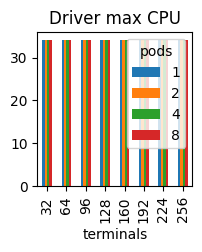

In [57]:
df = evaluation.get_monitoring_metric('total_cpu_util', component='loader').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("Driver max CPU")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,0.731174,0.760445,0.766224,0.744755
64,0.731174,0.760445,0.766224,0.744755
96,0.731174,0.760445,0.766224,0.744755
128,0.731174,0.760445,0.766224,0.744755
160,0.731174,0.760445,0.766224,0.744755
192,0.731174,0.760445,0.766224,0.744755
224,0.731174,0.760445,0.766224,0.744755
256,0.731174,0.760445,0.766224,0.744755


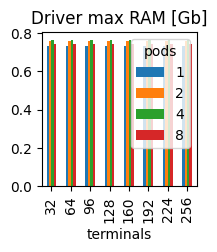

In [58]:
df = evaluation.get_monitoring_metric('total_cpu_memory', component='loader').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df/1024

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("Driver max RAM [Gb]")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,0.731174,0.760445,0.766224,0.744755
64,0.731174,0.760445,0.766224,0.744755
96,0.731174,0.760445,0.766224,0.744755
128,0.731174,0.760445,0.766224,0.744755
160,0.731174,0.760445,0.766224,0.744755
192,0.731174,0.760445,0.766224,0.744755
224,0.731174,0.760445,0.766224,0.744755
256,0.731174,0.760445,0.766224,0.744755


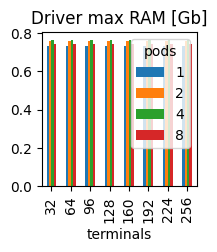

In [59]:
df = evaluation.get_monitoring_metric('total_cpu_memory_cached', component='loader').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df/1024

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("Driver max RAM [Gb]")
ax.set_xlabel("terminals")
df

pods,1,2,4,8
terminals,,,,
32,96.218491,95.956747,95.58312,95.725647
64,96.218491,95.956747,95.58312,95.725647
96,96.218491,95.956747,95.58312,95.725647
128,96.218491,95.956747,95.58312,95.725647
160,96.218491,95.956747,95.58312,95.725647
192,96.218491,95.956747,95.58312,95.725647
224,96.218491,95.956747,95.58312,95.725647
256,96.218491,95.956747,95.58312,95.725647


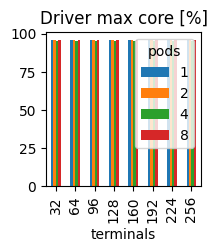

In [60]:
df = evaluation.get_monitoring_metric('total_cpu_util_max', component='loader').max()
df = pd.DataFrame(df)
df['index'] = list(df.index)
df['terminals'] = df.index.map(lambda x: str(df_aggregated.loc[x]['terminals']))
df['pods'] = df.index.map(lambda x: str(df_aggregated.loc[x]['pod_count']))
df = df.pivot(columns='pods', values=0, index='terminals')
df.index = df.index.map(lambda x: int(x))
df.sort_values("terminals", inplace=True)
df = df*100

ax = df.plot.bar(figsize=(2,2),legend=True)
ax.title.set_size(9)
ax.set_title("Driver max core [%]")
ax.set_xlabel("terminals")
df